In [1]:
!pwd

/Users/giakhang/dev/YOLOF-Mask/grad_cam


In [2]:
%cd ..

/Users/giakhang/dev/YOLOF-Mask


/Users/giakhang/miniconda3/envs/yolof_mask/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [3]:
import os
os.path.expanduser('~')

'/Users/giakhang'

In [4]:
import os
import sys

GRAD_CAM_DIR = os.path.join(os.path.expanduser('~'), 'dev/pytorch-grad-cam') 
sys.path.append(GRAD_CAM_DIR)

In [5]:
results_dirs = [
    './results/grad_cam/coco2017/input',
    './results/grad_cam/coco2017/backbone', 
    './results/grad_cam/coco2017/encoder', 
    './results/grad_cam/coco2017/ins_seg'
]

for d in results_dirs:
    if not os.path.exists(d):
        os.makedirs(d)

In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
import torchvision
import glob
from typing import Dict, OrderedDict
from PIL import Image
import random

from pytorch_grad_cam import EigenCAM, AblationCAM, AblationLayer, GradCAM, EigenGradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image, scale_cam_image

from detectron2.config import LazyConfig, instantiate
from detectron2.checkpoint import DetectionCheckpointer

In [7]:
def predict(input_tensor, model, detection_threshold):
    outputs = model.predict(input_tensor)
    pred_labels = outputs[0]['instances'].pred_classes.detach().cpu().numpy()
    pred_scores = outputs[0]['instances'].scores.detach().cpu().numpy()
    pred_bboxes = outputs[0]['instances'].pred_boxes.tensor.detach().cpu().numpy()
    pred_classes = [coco_names[i] for i in pred_labels]

    boxes, classes, labels, indices = [], [], [], []
    for index in range(len(pred_scores)):
        if pred_scores[index] >= detection_threshold:
            boxes.append(pred_bboxes[index].astype(np.int32))
            classes.append(pred_classes[index])
            labels.append(pred_labels[index])
            indices.append(index)
    boxes = np.int32(boxes)
    return boxes, classes, labels, indices

def draw_boxes(boxes, labels, classes, image):
    rs_image = image.copy()
    for i, box in enumerate(boxes):
        color = COLORS[labels[i]]
        cv2.rectangle(
            rs_image,
            (int(box[0]), int(box[1])),
            (int(box[2]), int(box[3])),
            color,
            2
        )
        cv2.putText(
            rs_image,
            classes[i],
            (int(box[0]), int(box[1] - 5)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            color,
            2,
            lineType=cv2.LINE_AA
        )
    return rs_image
    
coco_names = [
    "person", "bicycle", "car", "motorcycle", "airplane", "bus", "train", "truck", "boat",
    "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", "bird", "cat",
    "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", "backpack",
    "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", "sports ball",
    "kite", "baseball bat", "baseball glove", "skateboard", "surfboard", "tennis racket",
    "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana", "apple",
    "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake", "chair",
    "couch", "potted plant", "bed", "dining table", "toilet", "TV", "laptop", "mouse",
    "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator",
    "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"
]

# This will help us create a different color for each class
COLORS = np.random.uniform(0, 255, size=(len(coco_names), 3))

In [8]:
pixel_mean = np.array([103.530, 116.280, 123.675])
pixel_std = np.array([57.375, 57.120, 58.395])

device = 'cpu'

In [9]:
image_path = './datasets/coco2017/val2017/000000052507.jpg'
#image_path = '/home/giakhang/dev/YOLOF-Mask/datasets/coco2017/coco2017/val2017/000000081766.jpg'

raw_image = cv2.imread(image_path)
image_float_np = np.float32(raw_image) / 255.0
image_input = np.float32((raw_image - pixel_mean[None, None, :]) / pixel_std[None, None, :])
rgb_image = np.uint8(np.ascontiguousarray(raw_image[..., ::-1]))

transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
])

input_tensor = transform(image_input)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_tensor = input_tensor.to(device)

# Add a batch dimension
input_tensor = input_tensor.unsqueeze(0)

In [10]:
config_path = './configs/coco/yolof_mask_RegNetY_4gf_SAM_3x.py'
weight_path = '/Users/giakhang/Downloads/yolof_mask_regnety_coco_best.pth'
cfg = LazyConfig.load(config_path)

cfg.model.decoder.num_classes = len(coco_names)
cfg.model.mask_head.num_classes = len(coco_names)

model = instantiate(cfg.model)
model = model.to(device)
model.eval()
_ = DetectionCheckpointer(model).load(weight_path)

/Users/giakhang/dev/detectron2/detectron2/config/lazy.py:167: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  return old_import(name, globals, locals, fromlist=fromlist, level=level)


/Users/giakhang/miniconda3/envs/yolof_mask/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/_temp/anaconda/conda-bld/pytorch_1702400234613/work/aten/src/ATen/native/TensorShape.cpp:3527.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


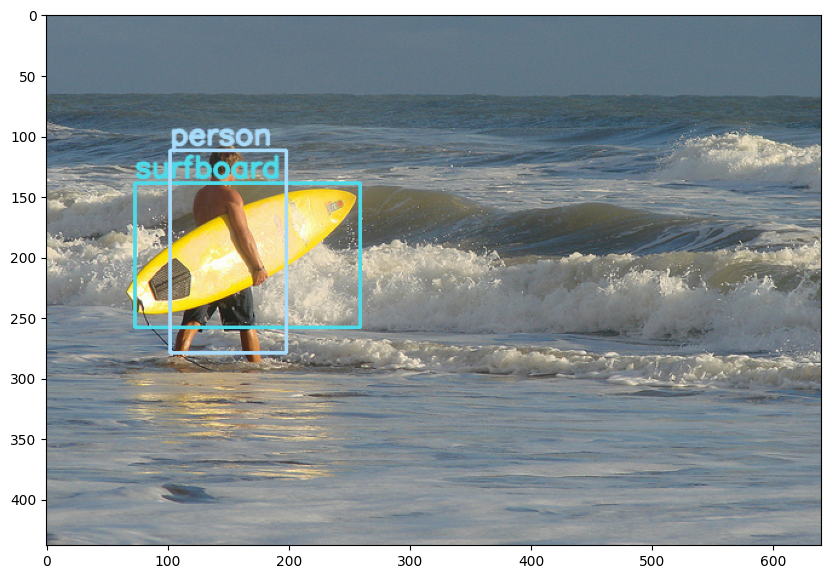

In [11]:
# Run the model and display the detections
boxes, classes, labels, indices = predict(input_tensor, model, 0.5)
drawed_image = draw_boxes(boxes, labels, classes, rgb_image)

_ = plt.figure(figsize=(10, 10))
plt.imshow(drawed_image)

In [12]:
class YOLOFMaskBoxScoreTarget:
    def __init__(self, labels, bounding_boxes, iou_threshold=0.5):
        self.labels = labels
        self.bounding_boxes = bounding_boxes
        self.iou_threshold = iou_threshold

    def __call__(self, model_outputs):
        if device == 'cuda':
            output = torch.Tensor([0]).cuda()

        if len(model_outputs['instances'].pred_boxes.tensor) == 0:
            return output

        for box, label in zip(self.bounding_boxes, self.labels):
            if device == 'cuda':
                box = torch.Tensor(box[None, :]).cuda()

            ious = torchvision.ops.box_iou(box, model_outputs['instances'].pred_boxes.tensor)
            index = ious.argmax()
            if ious[0, index] > self.iou_threshold and model_outputs['instances'].pred_classes[index] == label:
                score = ious[0, index] + model_outputs['instances'].scores[index]
                output = output + score
        
        return output

In [13]:
def transform_backbone_output(x):
    if isinstance(x, Dict):
        return x['s4']
    return x

def renormalize_cam_in_bounding_boxes(boxes, image_float_np, grayscale_cam):
    """Normalize the CAM to be in the range [0, 1] 
    inside every bounding boxes, and zero outside of the bounding boxes. """
    renormalized_cam = np.zeros(grayscale_cam.shape, dtype=np.float32)
    images = []
    for x1, y1, x2, y2 in boxes:
        img = renormalized_cam * 0
        img[y1:y2, x1:x2] = scale_cam_image(grayscale_cam[y1:y2, x1:x2].copy())    
        images.append(img)
    
    renormalized_cam = np.max(np.float32(images), axis = 0)
    renormalized_cam = scale_cam_image(renormalized_cam)
    eigencam_image_renormalized = show_cam_on_image(image_float_np, renormalized_cam, use_rgb=True)
    image_with_bounding_boxes = draw_boxes(boxes, labels, classes, eigencam_image_renormalized)
    return image_with_bounding_boxes

In [14]:
class YOLOFMaskSegmentationBranch(torch.nn.Module):
    def __init__(self, model, instance_id=0):
        super(YOLOFMaskSegmentationBranch, self).__init__()
        self.model = model
        self.model.eval()
        self.instance_id = instance_id
    
    def predict(self, input_tensor):
        features = model.backbone(input_tensor)
        features = features[model.backbone._out_features[-1]]
        features_p5 = model.encoder(features)
        box_cls, box_delta = model.decoder(features_p5)
        anchors = model.anchor_generator([features_p5])
        proposals = model.inference([box_cls], [box_delta], anchors, [x.shape[-2:] for x in input_tensor])
        proposals = [p[self.instance_id] for p in proposals]
        proposal_boxes = [x.pred_boxes for x in proposals]
        box_features = model.pooler([features_p5], proposal_boxes)
        results = model.mask_head(box_features, proposals)
        return results

In [15]:
class SegmentationTarget:
    def __init__(self, mask):
        self.mask = torch.from_numpy(mask)
        if torch.cuda.is_available():
            self.mask = self.mask.cuda()
        
    def __call__(self, model_output):
        pred_mask = model_output.pred_masks.squeeze()
        return (pred_mask * self.mask).sum()

In [16]:
instance_id = 0
yolof_mask_seg_model = YOLOFMaskSegmentationBranch(model, instance_id=instance_id)

result = yolof_mask_seg_model.predict(input_tensor)
cls_name = coco_names[result[0].pred_classes.detach().cpu().numpy()[0]]
mask_float = np.float32(result[0].pred_masks.detach().squeeze().cpu().numpy() > 0.5)

In [17]:
target_layers = [
    model.backbone,
    model.encoder,
    yolof_mask_seg_model.model.mask_head.mask_fcn6
]

target_names = ['backbone', 'encoder', 'mask_head']

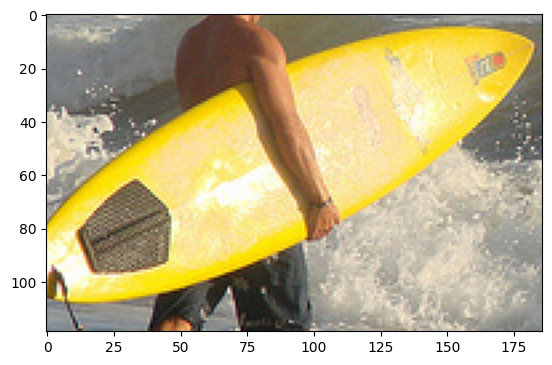

In [18]:
chossen_box = boxes[instance_id]
crop_img = rgb_image[chossen_box[1]:chossen_box[3], chossen_box[0]:chossen_box[2], :]

plt.imshow(crop_img)

In [19]:
cam_imgs = []
grayscale_cams = []
pred_ins_classes = []

for name, layer in zip(target_names, target_layers):
    if name != 'mask_head':
        targets = [YOLOFMaskBoxScoreTarget(labels=labels, bounding_boxes=boxes, iou_threshold=0.5)]
        cam = EigenCAM(
            model,
            [layer],
            reshape_transform=transform_backbone_output,
        )
        grayscale_cam = cam(input_tensor, targets=targets)[0, :]
        cam_image = show_cam_on_image(image_float_np[..., ::-1], grayscale_cam, use_rgb=True)
        cam_image = draw_boxes(boxes, labels, classes, cam_image)
    else:
        targets = [SegmentationTarget(mask_float)]
        cam = GradCAM(model=yolof_mask_seg_model, target_layers=[layer])
        grayscale_cam = cam(input_tensor, targets=targets)[0, :]
        grayscale_cam = cv2.resize(grayscale_cam, (crop_img.shape[1], crop_img.shape[0]))
        cam_image = show_cam_on_image(crop_img / 255.0, grayscale_cam, use_rgb=True)
        cam_image = cv2.resize(cam_image, (cam_imgs[-1].shape[1], cam_imgs[-1].shape[0]))
        pred_ins_classes.append(cls_name)
    cam_imgs.append(cam_image)
    grayscale_cams.append(grayscale_cam)

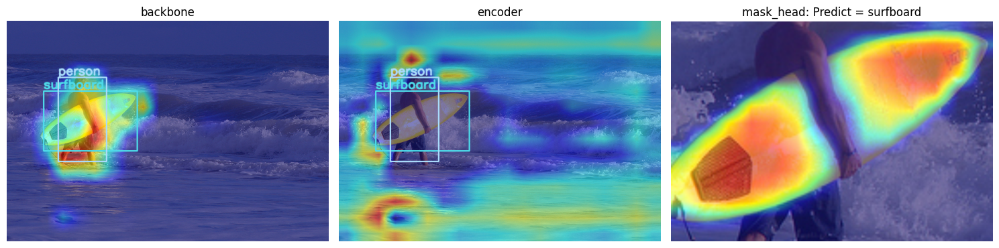

In [20]:
axs = plt.subplots(1, 3, figsize=(15, 15))

for i, ax in enumerate(axs[1]):
    ax.imshow(cam_imgs[i])
    if (i + 1) % len(target_names) == 0:
        ax.set_title(f'{target_names[i]}: Predict = {pred_ins_classes[i // len(target_names)]}') 
    else:
        ax.set_title(target_names[i])
    ax.axis('off')

plt.tight_layout()

In [21]:
num_images = 10
image_dir = './datasets/coco2017/train2017'
image_paths = glob.glob(os.path.join(image_dir, '*.jpg'))
choose_imgs = random.choices(image_paths, k=num_images)

instance_id = 0
yolof_mask_seg_model = YOLOFMaskSegmentationBranch(model, instance_id=instance_id)

target_layers = [
    model.backbone.s4,
    model.encoder.dilated_encoder_blocks,
    yolof_mask_seg_model.model.mask_head.mask_fcn6
]

target_names = ['backbone.s4', 'encoder.dilated_encoder_blocks', 'mask_head']

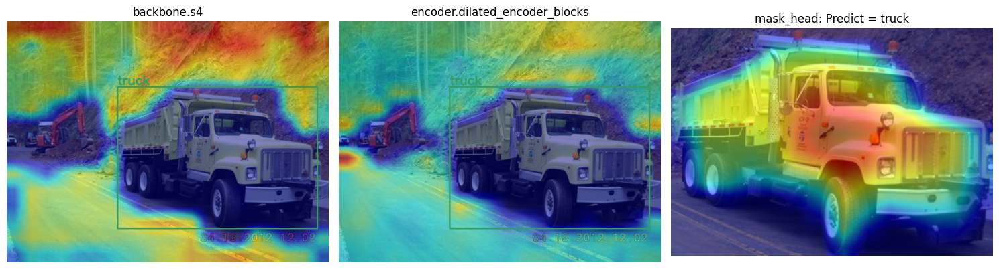

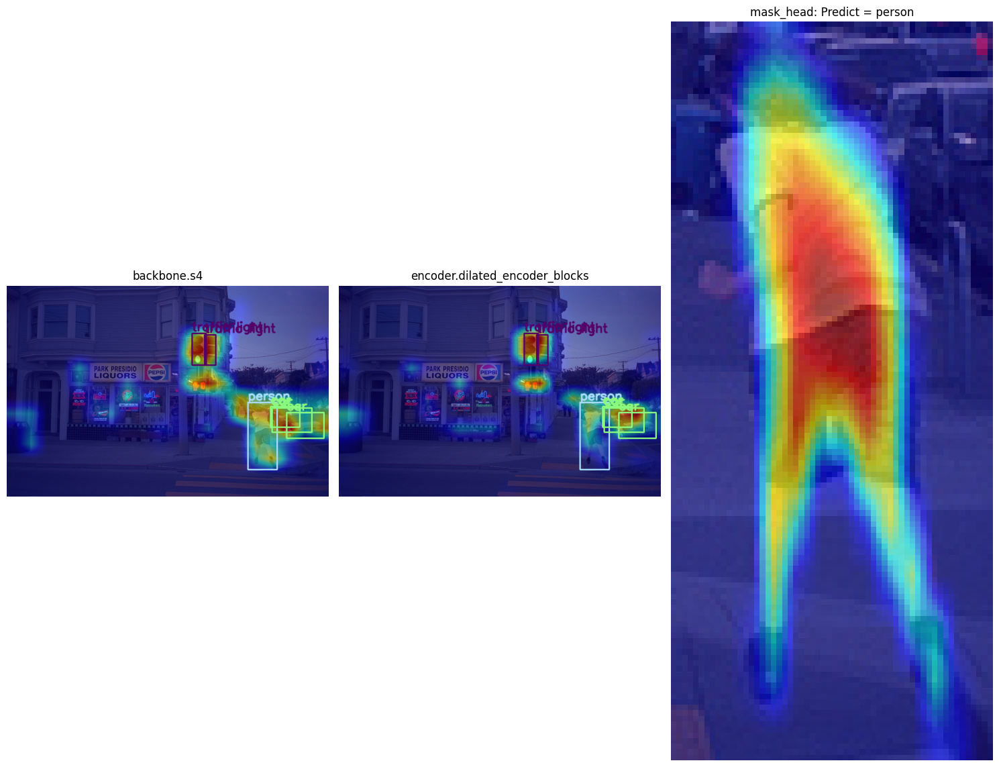

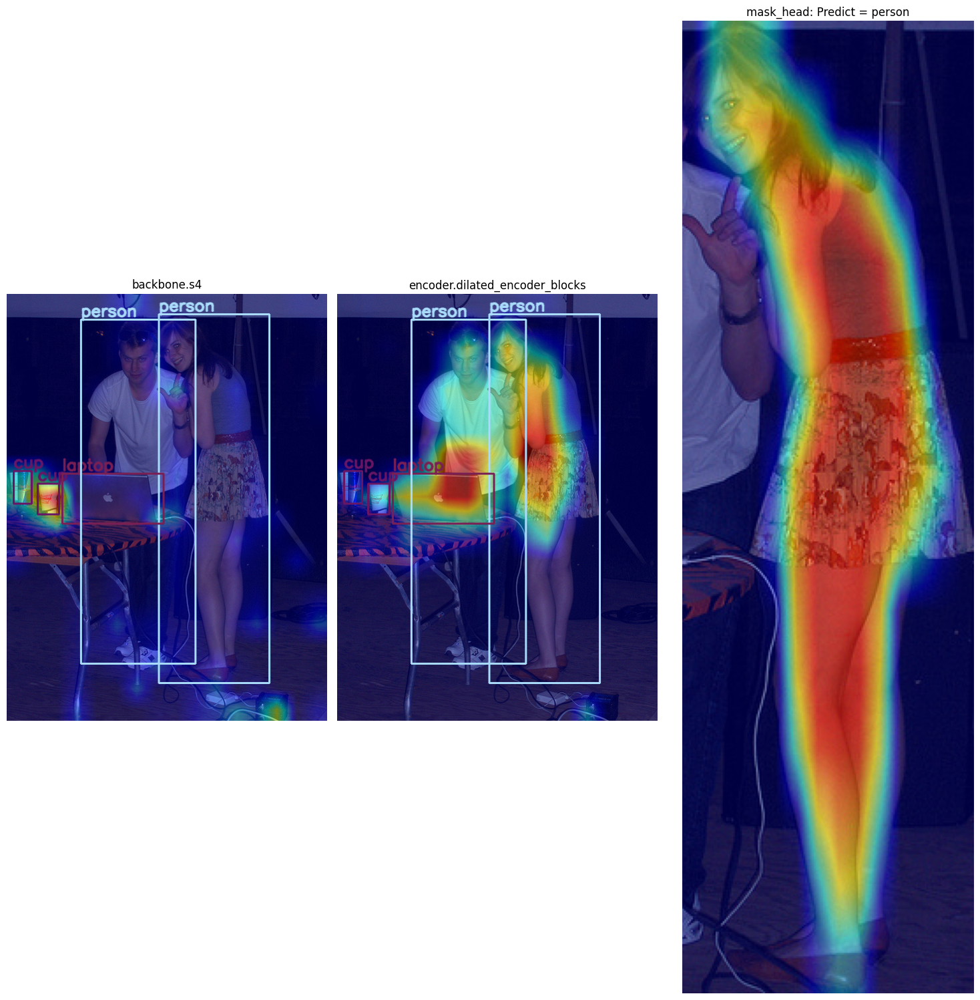

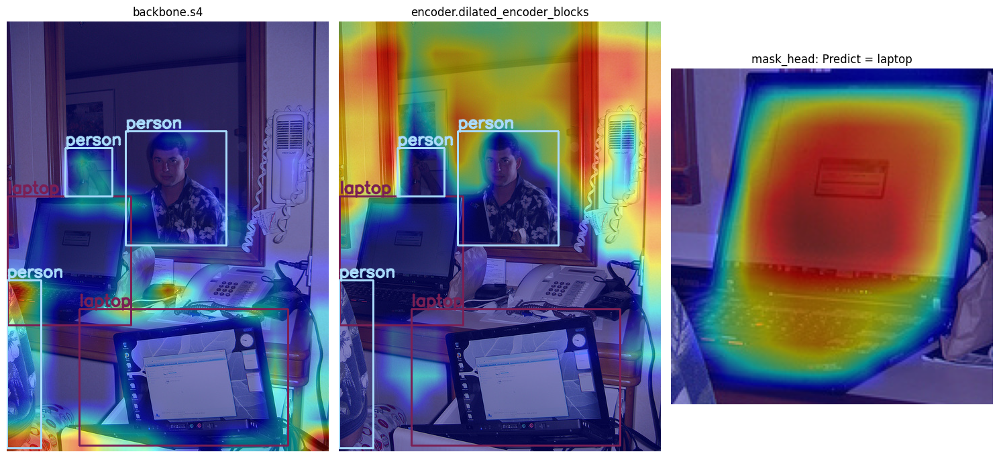

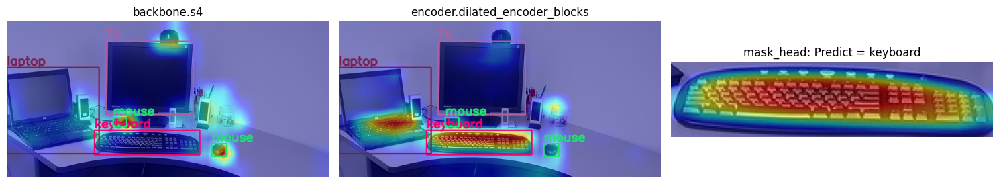

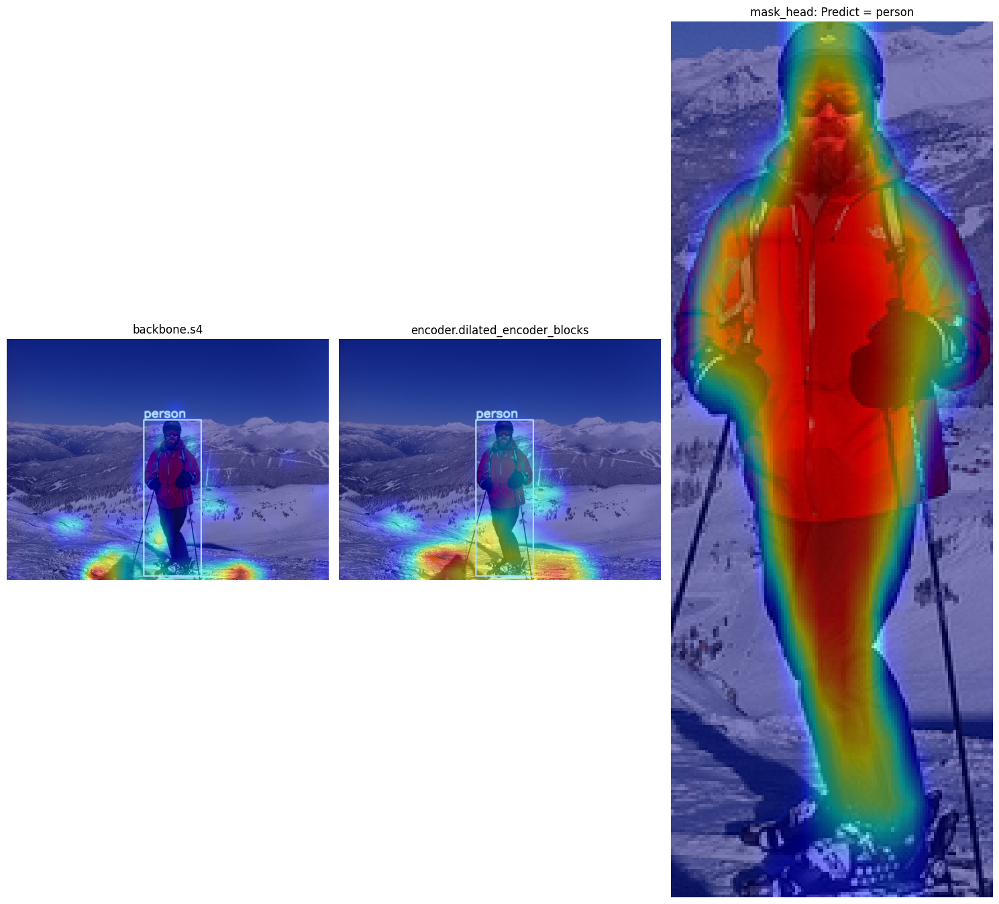

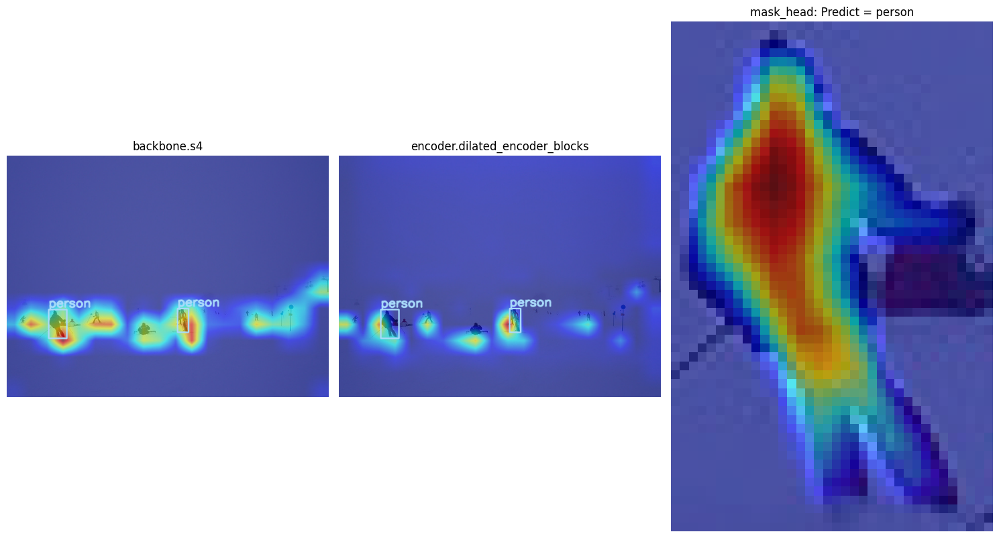

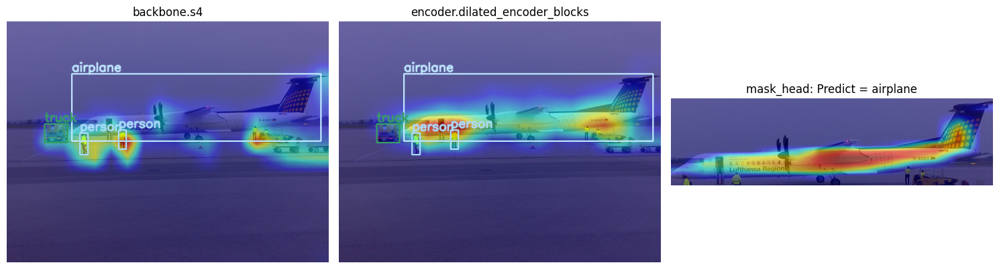

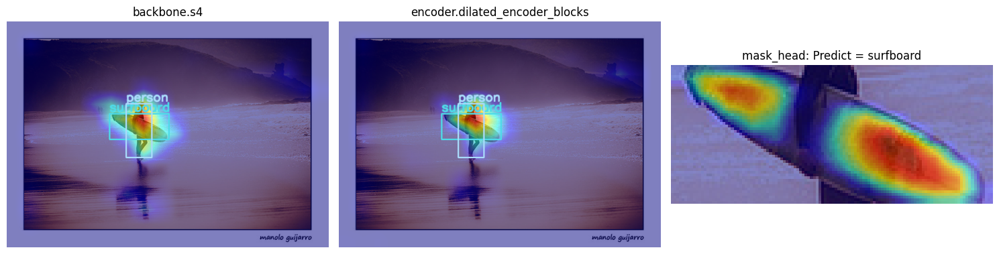

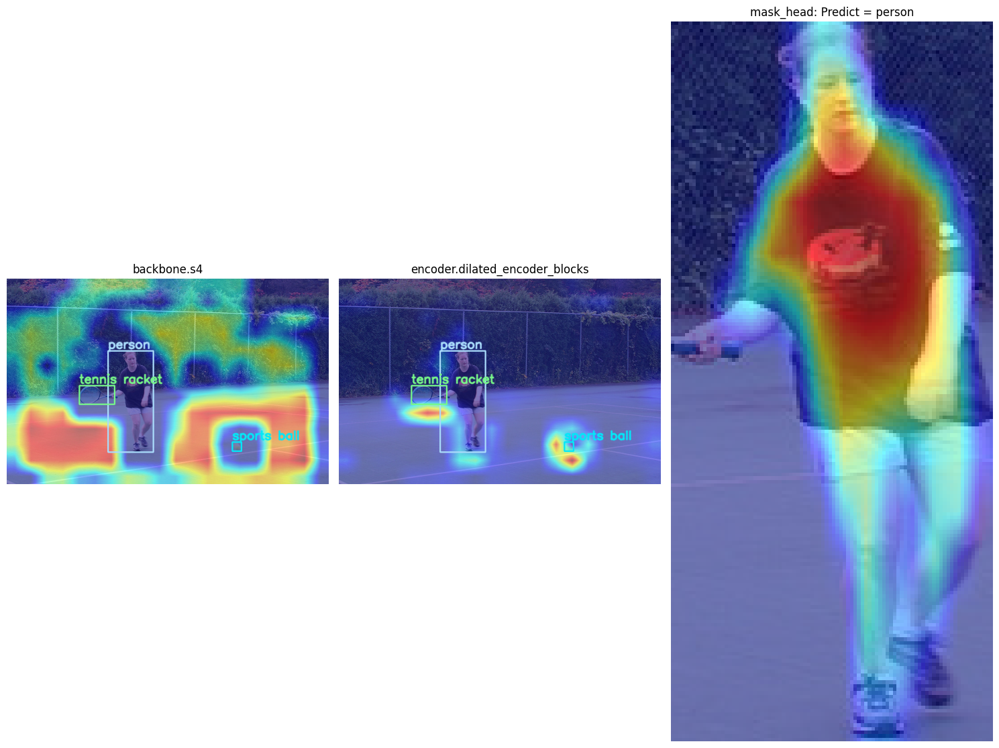

In [22]:
for img_path in choose_imgs:
    img_name = img_path.split('/')[-1]
    raw_image = cv2.imread(img_path)
    image_float_np = np.float32(raw_image) / 255.0
    image_input = np.float32((raw_image - pixel_mean[None, None, :]) / pixel_std[None, None, :])
    rgb_image = np.uint8(np.ascontiguousarray(raw_image[..., ::-1]))

    cv2.imwrite(os.path.join(results_dirs[0], img_name), rgb_image[..., ::-1])

    transform = torchvision.transforms.Compose([
        torchvision.transforms.ToTensor(),
    ])

    input_tensor = transform(image_input)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    input_tensor = input_tensor.to(device)

    # Add a batch dimension
    input_tensor = input_tensor.unsqueeze(0)

    boxes, classes, labels, indices = predict(input_tensor, model, 0.5)
    if not len(boxes):
        continue

    instance_id = 0

    result = yolof_mask_seg_model.predict(input_tensor)
    cls_name = coco_names[result[0].pred_classes.detach().cpu().numpy()[0]]
    mask_float = np.float32(result[0].pred_masks.detach().squeeze().cpu().numpy() > 0.5)

    chossen_box = boxes[instance_id]
    crop_img = rgb_image[chossen_box[1]:chossen_box[3], chossen_box[0]:chossen_box[2], :]

    cam_imgs = []
    grayscale_cams = []
    pred_ins_classes = []

    for idx, (name, layer) in enumerate(zip(target_names, target_layers)):
        if name != 'mask_head':
            targets = [YOLOFMaskBoxScoreTarget(labels=labels, bounding_boxes=boxes, iou_threshold=0.5)]
            cam = EigenCAM(
                model,
                [layer],
                reshape_transform=transform_backbone_output,
            )
            grayscale_cam = cam(input_tensor, targets=targets)[0, :]
            cam_image = show_cam_on_image(image_float_np[..., ::-1], grayscale_cam, use_rgb=True)
            cam_image = draw_boxes(boxes, labels, classes, cam_image)
        else:
            targets = [SegmentationTarget(mask_float)]
            cam = GradCAM(model=yolof_mask_seg_model, target_layers=[layer])
            grayscale_cam = cam(input_tensor, targets=targets)[0, :]
            grayscale_cam = cv2.resize(grayscale_cam, (crop_img.shape[1], crop_img.shape[0]))
            cam_image = show_cam_on_image(crop_img / 255.0, grayscale_cam, use_rgb=True)
            #cam_image = cv2.resize(cam_image, (cam_imgs[-1].shape[1], cam_imgs[-1].shape[0]))
            pred_ins_classes.append(cls_name)
        cam_imgs.append(cam_image)
        grayscale_cams.append(grayscale_cam)

        cv2.imwrite(os.path.join(results_dirs[idx+1], img_name), cam_image[..., ::-1])

    axs = plt.subplots(1, 3, figsize=(15, 15))

    for i, ax in enumerate(axs[1]):
        ax.imshow(cam_imgs[i])
        if (i + 1) % len(target_names) == 0:
            ax.set_title(f'{target_names[i]}: Predict = {pred_ins_classes[i // len(target_names)]}') 
        else:
            ax.set_title(target_names[i])
        ax.axis('off')

    plt.tight_layout()